In [1]:
pip install ultralytics

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import shutil
import ultralytics
import os

installed_path = r"D:\Py\envs\seg\Lib\site-packages\ultralytics"

local_path = r"C:\Users\shin chen\Desktop\WanderPal\code\SI_code\ultralytics"

shutil.rmtree(installed_path)
shutil.copytree(local_path, installed_path)

import importlib
importlib.reload(ultralytics)

print(f"ultralytics 已替换为：{ultralytics.__file__}")


ultralytics 已替换为：c:\Users\shin chen\Desktop\WanderPal\code\SI_code\ultralytics\__init__.py


In [3]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
import cv2
import yaml
from PIL import Image
from collections import deque
from ultralytics import YOLO
from IPython.display import Video

In [4]:
cd ultralytics

c:\Users\shin chen\Desktop\WanderPal\code\SI_code\ultralytics


In [5]:
sns.set_theme(rc={'axes.facecolor': '#ffe4de'}, style='darkgrid')

In [6]:
if __name__ == '__main__':
    model = YOLO(r"C:\Users\shin chen\Desktop\WanderPal\code\SI_code\ultralytics\cfg\models\v8\SA-SS-seg.yaml") 

WARNING  no model scale passed. Assuming scale='n'.


In [7]:
# set the dataset
dataset_path = r'C:\Users\shin chen\Desktop\WanderPal\code\SI_code\Curbstone_dataset'
yaml_file_path = os.path.join(dataset_path, 'data.yaml')
print(yaml_file_path)
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

C:\Users\shin chen\Desktop\WanderPal\code\SI_code\Curbstone_dataset\data.yaml
names:
- curb
nc: 1
test: ../test/images
train: ../train/images
val: ../valid/images



In [8]:
# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')
# test_images_path = os.path.join(dataset_path, 'test', 'images')
# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0
# num_test_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()
# test_image_sizes = set()

In [9]:
# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'):
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

In [10]:
# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

Number of training images: 1587
Number of validation images: 235


In [11]:
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


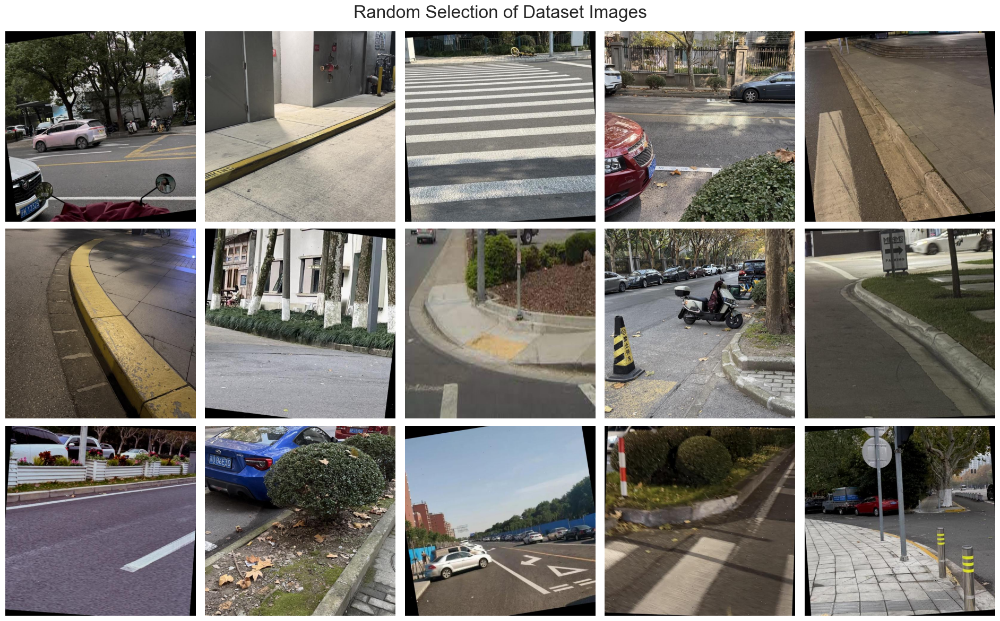

In [12]:
# Set the seed for the random number generator
random.seed(42)

# Create a list of image files
image_files = [f for f in os.listdir(train_images_path) if f.endswith('.jpg')]

# Randomly select 15 images
random_images = random.sample(image_files, 15)

# Create a new figure
plt.figure(figsize=(19, 12))

# Loop through each image and display it in a 3x5 grid
for i, image_file in enumerate(random_images):
    image_path = os.path.join(train_images_path, image_file)
    image = Image.open(image_path)
    plt.subplot(3, 5, i + 1)
    plt.imshow(image)
    plt.axis('off')

# Add a suptitle
plt.suptitle('Random Selection of Dataset Images', fontsize=24)

# Show the plot
plt.tight_layout()
plt.show()

# Deleting unnecessary variable to free up memory
del image_files

In [ ]:
# Train the model on our custom dataset
results = model.train(
    data=yaml_file_path,     # Path to the dataset configuration file
    epochs=400,              # Number of epochs to train for
    imgsz=640,               # Size of input images as integer
    patience=50,             # Epochs to wait for no observable improvement for early stopping of training
    batch=4,                # Number of images per batch
    optimizer='SGD',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    lr0=0.01,                # Initial learning rate
    momentum=0.937,          # Momentum for SGD optimizer
    dropout=0.25,            # Use dropout regularization
    device='0',                # Device to run on, i.e. cuda device=0
    seed=42,                  # Random seed for reproducibility
    pretrained='false'
)

In [13]:
cd runs/segment

c:\Users\shin chen\Desktop\WanderPal\code\SI_code\ultralytics\runs\segment


In [ ]:
# Validation
# Set the correct path for post_training_files_path
post_training_files_path = r'C:\Users\shin chen\Desktop\WanderPal\code\SI_code'

# Construct the path to the best model weights file using os.path.join
best_model_path = os.path.join(post_training_files_path, 'best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
metrics = best_model.val(split='val')

Ultralytics 8.3.49  Python-3.8.0 torch-2.4.1+cpu CPU (Intel Core(TM) i7-10750H 2.60GHz)
SA-SS-Dy summary: 358 layers, 3,979,772 parameters, 0 gradients, 192.0 GFLOPs


FileNotFoundError: '/autodl-fs/data/1822/data.yaml' does not exist

In [ ]:
# 1.Set the correct paths
post_training_files_path = r'C:\Users\shin chen\Desktop\WanderPal\code\SI_code'
best_model_path = os.path.join(post_training_files_path, 'best.pt')
data_yaml_path = os.path.join(post_training_files_path, 'Curbstone_dataset', 'data.yaml')

# 2. Load the best model
best_model = YOLO(best_model_path)

# 3. Run the validation on the validation set
metrics = best_model.val(data=data_yaml_path)

print(metrics)


Ultralytics 8.3.49  Python-3.8.0 torch-2.4.1+cpu CPU (Intel Core(TM) i7-10750H 2.60GHz)
SA-SS-Dy summary: 358 layers, 3,979,772 parameters, 0 gradients, 192.0 GFLOPs


val: Scanning C:\Users\shin chen\Desktop\WanderPal\code\SI_code\Curbstone_dataset\valid\labels.cache... 235 images, 0 backgrounds, 0 corrupt: 100%|██████████| 235/235 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95):   0%|          | 0/15 [00:10<?, ?it/s]


KeyboardInterrupt: 

In [16]:
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df = pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value'])
# Display the DataFrame
metrics_df.round(3)

NameError: name 'metrics' is not defined


image 1/1 C:\Users\shin chen\Desktop\WanderPal\code\SI_code\Curbstone_dataset\valid\images\pic-1021_jpg.rf.37f254282f1b076884f734ebfbbfa13b.jpg: 640x640 4 curbs, 726.1ms
Speed: 2.0ms preprocess, 726.1ms inference, 43.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\shin chen\Desktop\WanderPal\code\SI_code\Curbstone_dataset\valid\images\pic-1080_jpg.rf.26adb74beefed0001ef532d96a617d85.jpg: 640x640 1 curb, 743.0ms
Speed: 3.0ms preprocess, 743.0ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\shin chen\Desktop\WanderPal\code\SI_code\Curbstone_dataset\valid\images\pic-1107_jpg.rf.838fc2de94a259d74eac624c3802a088.jpg: 640x640 1 curb, 744.0ms
Speed: 3.0ms preprocess, 744.0ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\shin chen\Desktop\WanderPal\code\SI_code\Curbstone_dataset\valid\images\pic-1133_jpg.rf.2703501740da4428d01d530fdcbadef7.jpg: 640x640 3 curbs, 763.0ms
Speed: 4.0ms preprocess

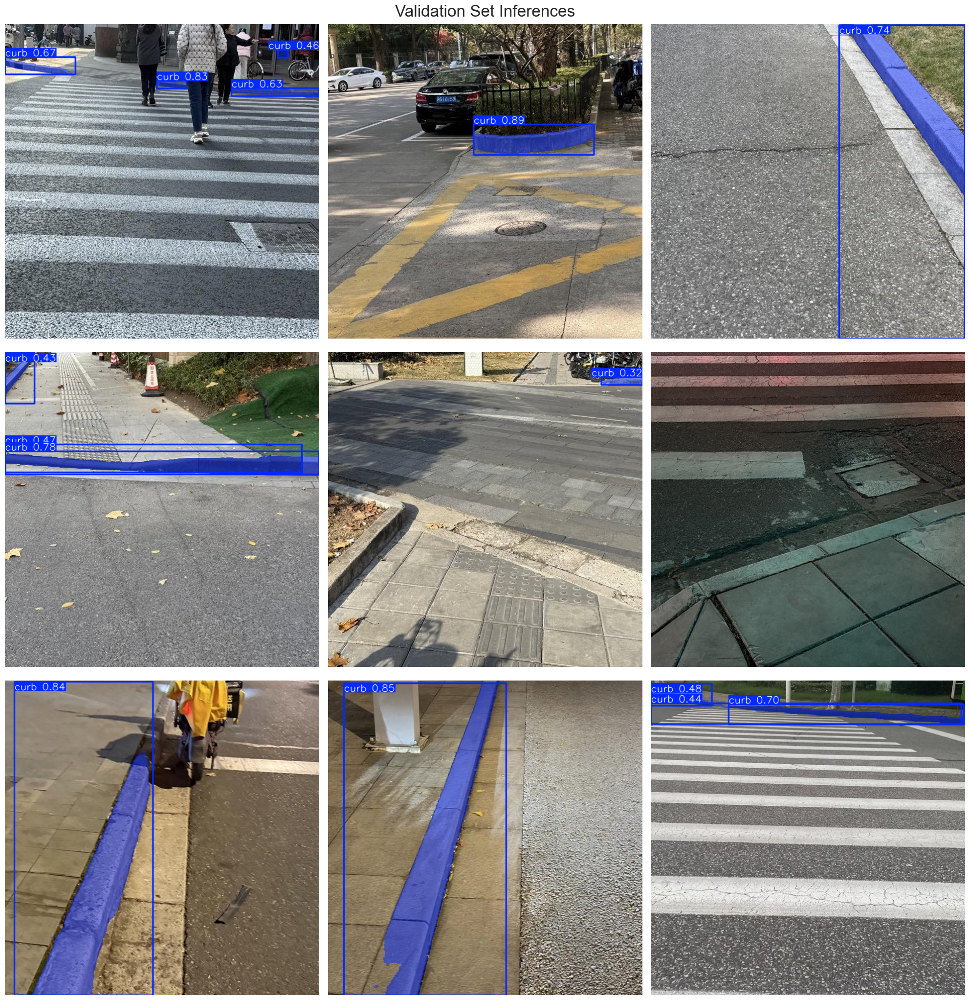

In [ ]:
# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 9)]

# Initialize the subplot
fig, axes = plt.subplots(3, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640)
    annotated_image = results[0].plot()
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Define the destination path in the working directory
video_path = r'C:\Users\shin chen\Desktop\WanderPal\code\SI_code\1.mp4'

# Initiate vehicle detection on the sample video using the best performing model and save the output
best_model.predict(source=video_path, save=True)



WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/1021) C:\Users\shin chen\Desktop\WanderPal\code\SI_code\1.mp4: 384x640 (no detections), 536.7ms
video 1/1 (frame 2/1021) C:\Users\shin chen\Desktop\WanderPal\code\SI_code\1.mp4: 384x640 (no detections), 424.4ms
video 1/1 (frame 3/1021) C:\Users\shin chen\Desktop\WanderPal\code\SI_code\1.mp4: 384x640 (no detections), 416.0ms
video 1/1 (frame 4/1021) C:\Users\shin chen\Desktop\WanderPal\code\SI_code\1.mp4: 384x640 (no detections), 452.9m

KeyboardInterrupt: 

In [ ]:
import cv2
import time
from ultralytics import YOLO

best_model = YOLO(r"C:\Users\shin chen\Desktop\WanderPal\code\SI_code\best.pt")

video_path = r'C:\Users\shin chen\Desktop\WanderPal\code\SI_code\2\22.mp4'

cap = cv2.VideoCapture(video_path)

fps = cap.get(cv2.CAP_PROP_FPS)
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

frame_interval = int(fps * 2)

output_video_path = r'C:\Users\shin chen\Desktop\WanderPal\code\SI_code\output_video.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter(output_video_path, fourcc, fps, (width, height))

frame_count = 0

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame_count += 1

    if frame_count % frame_interval == 0:
        results = best_model.predict(source=frame, imgsz=320, conf=0.1)
        print(f"检测完成，第 {frame_count} 帧，等待 2 秒...")
        annotated_frame = results[0].plot() 
        out.write(annotated_frame)
        cv2.imshow("Video", annotated_frame)
        time.sleep(2) 
    else:
        out.write(frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()

print(f"Output_path：{output_video_path}")



0: 192x320 (no detections), 123.7ms
Speed: 2.0ms preprocess, 123.7ms inference, 0.0ms postprocess per image at shape (1, 3, 192, 320)
检测完成，第 60 帧，等待 2 秒...

0: 192x320 (no detections), 122.3ms
Speed: 0.0ms preprocess, 122.3ms inference, 0.0ms postprocess per image at shape (1, 3, 192, 320)
检测完成，第 120 帧，等待 2 秒...

0: 192x320 1 curb, 120.7ms
Speed: 1.0ms preprocess, 120.7ms inference, 2.0ms postprocess per image at shape (1, 3, 192, 320)
检测完成，第 180 帧，等待 2 秒...

0: 192x320 2 curbs, 117.7ms
Speed: 1.0ms preprocess, 117.7ms inference, 2.0ms postprocess per image at shape (1, 3, 192, 320)
检测完成，第 240 帧，等待 2 秒...

0: 192x320 2 curbs, 119.7ms
Speed: 0.0ms preprocess, 119.7ms inference, 2.0ms postprocess per image at shape (1, 3, 192, 320)
检测完成，第 300 帧，等待 2 秒...

0: 192x320 1 curb, 119.7ms
Speed: 1.0ms preprocess, 119.7ms inference, 1.0ms postprocess per image at shape (1, 3, 192, 320)
检测完成，第 360 帧，等待 2 秒...

0: 192x320 1 curb, 121.6ms
Speed: 0.0ms preprocess, 121.6ms inference, 2.0ms postproce